## Training Data Generation (Augmented Image Data)

In [52]:
# Importing useful dependencies
import io
import boto3
import torch
import random
import numpy as np
import requests
from PIL import Image
from io import BytesIO
from torchvision import transforms
import torchvision.transforms.functional as TF

# Set a seed for reproducibility
SEED = 10721
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
torch.cuda.manual_seed_all(SEED)

In [2]:
# Setup S3 client for MinIO (MinIO implements Amazon S3 API)
s3 = boto3.client(
    "s3",
    endpoint_url="http://127.0.0.1:9000", # MinIO API endpoint
    aws_access_key_id="minioadmin", # User name
    aws_secret_access_key="minioadmin", # Password
)

In [3]:
# We create a new Bucket in Min-IO to store our augmented training data

# List existing buckets
buckets = [b["Name"] for b in s3.list_buckets()["Buckets"]]

# Function that given a name, creates a bucket
def createBucket(name, list_buckets):
    if name in list_buckets:
        print(f"Bucket '{name}' already exists!")
    else:
        s3.create_bucket(Bucket=name)
        print(f"Created bucket: {name}")

# Create a bucket named landing_zone
createBucket("training-data-construction-zone", buckets)
# Sub-bucket: Baseline Training Data
s3.put_object(Bucket="training-data-construction-zone", Key="image_augmented-training-data/")

Bucket 'training-data-construction-zone' already exists!


{'ResponseMetadata': {'RequestId': '187A6233B01C2451',
  'HostId': 'dd9025bab4ad464b049177c95eb6ebf374d3b3fd1af9251148b658df7ac2e3e8',
  'HTTPStatusCode': 200,
  'HTTPHeaders': {'accept-ranges': 'bytes',
   'content-length': '0',
   'etag': '"d41d8cd98f00b204e9800998ecf8427e"',
   'server': 'MinIO',
   'strict-transport-security': 'max-age=31536000; includeSubDomains',
   'vary': 'Origin, Accept-Encoding',
   'x-amz-checksum-crc32': 'AAAAAA==',
   'x-amz-checksum-type': 'FULL_OBJECT',
   'x-amz-id-2': 'dd9025bab4ad464b049177c95eb6ebf374d3b3fd1af9251148b658df7ac2e3e8',
   'x-amz-request-id': '187A6233B01C2451',
   'x-content-type-options': 'nosniff',
   'x-ratelimit-limit': '2101',
   'x-ratelimit-remaining': '2101',
   'x-xss-protection': '1; mode=block',
   'date': 'Sat, 22 Nov 2025 16:49:38 GMT'},
  'RetryAttempts': 0},
 'ETag': '"d41d8cd98f00b204e9800998ecf8427e"',
 'ChecksumCRC32': 'AAAAAA==',
 'ChecksumType': 'FULL_OBJECT'}

In this notebook, we will apply various data augmentation techniques to increase the diversity of our image data and enhance the variance in the training set. Specifically, we will implement four techniques: **horizontal flip**, **vertical flip**, **random crop**, and **random blur**.

- **Horizontal flip** mirrors the image from left to right.
- **Vertical flip** mirrors the image from top to bottom.
- **Random crop** extracts a randomly selected sub-region of the image and then resizes it back to the original resolution.
- **Random blur** applies a Gaussian blur with a randomly sampled strength to simulate out-of-focus or low-quality conditions.

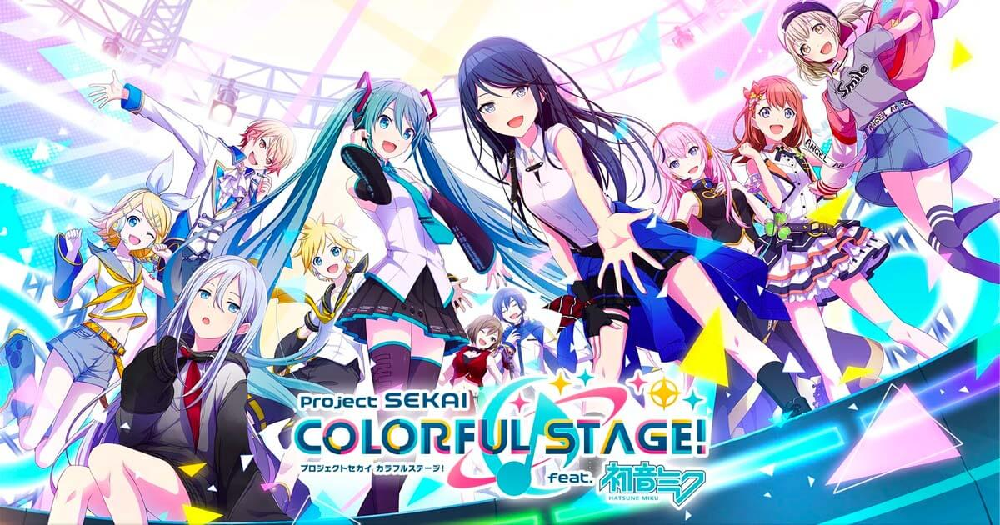

In [8]:
# We can use a sample image found online
response = requests.get("https://licensinginternational.org/wp-content/uploads/2021/08/sega.jpg")
samp_img = Image.open(BytesIO(response.content))
display(samp_img)

In the following cell we define the methods we described previously

In [43]:
# This function applies an image augmentation technique to the given image
def augment_image(image: Image.Image, transformer, suffix: str = "crop"):

    if (suffix not in ["crop", "flip-x", "flip-y", "blur"]):
        return image
    
    # Apply the augmentation to the input image
    if suffix == "crop":
        
        # For random crops we sample a region per image, so we capture the crop parameters to know exactly what was applied.
        i, j, h, w = transformer.get_params(image, output_size=transformer.size) # sample crop parameters
        # Apply crop manually
        aug_image = TF.crop(image, i, j, h, w)
        # Resize back to 512x512
        resize_to_512 = transforms.Resize((512, 512))  # resize image to 512x512 pixels # resize helper used after cropping
        aug_image = resize_to_512(aug_image)
        
    else: # "flip-x", "flip-y", "blur"

        # Apply augmentation technique
        aug_image = transformer(image)
    
    return aug_image

# Define image transformers
hflip_transform = transforms.RandomHorizontalFlip(p=1.0) # always flip image horizontally (left-right)
vflip_transform = transforms.RandomVerticalFlip(p=1.0) # always flip image vertically (top-bottom)
crop_transform = transforms.RandomCrop(400) # randomly crop a 400x400 patch from the original image
blur_transform = transforms.GaussianBlur(kernel_size=11, sigma=(1.0, 3.0)) # random sigma in this range of sigma

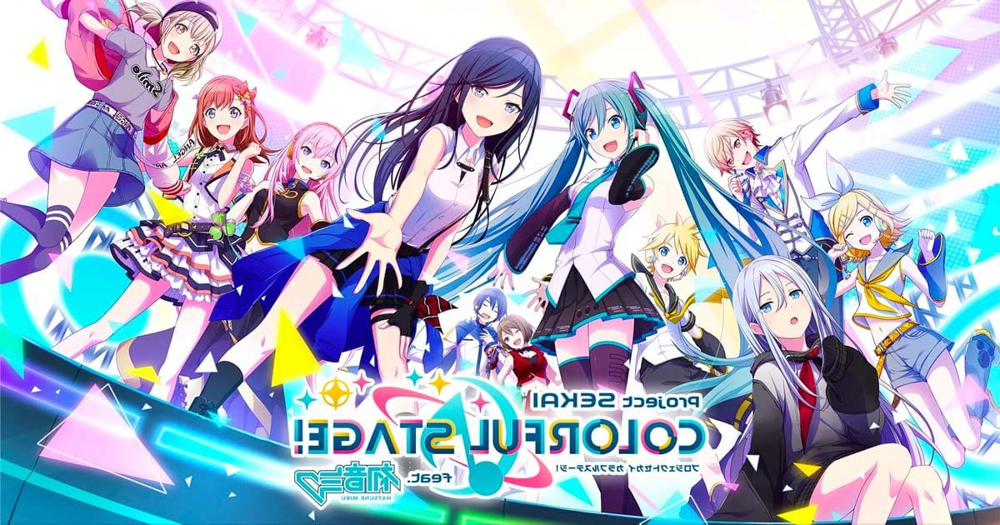

In [44]:
# Test Horizontal flip method
display(augment_image(samp_img, hflip_transform, suffix = "flip-x"))

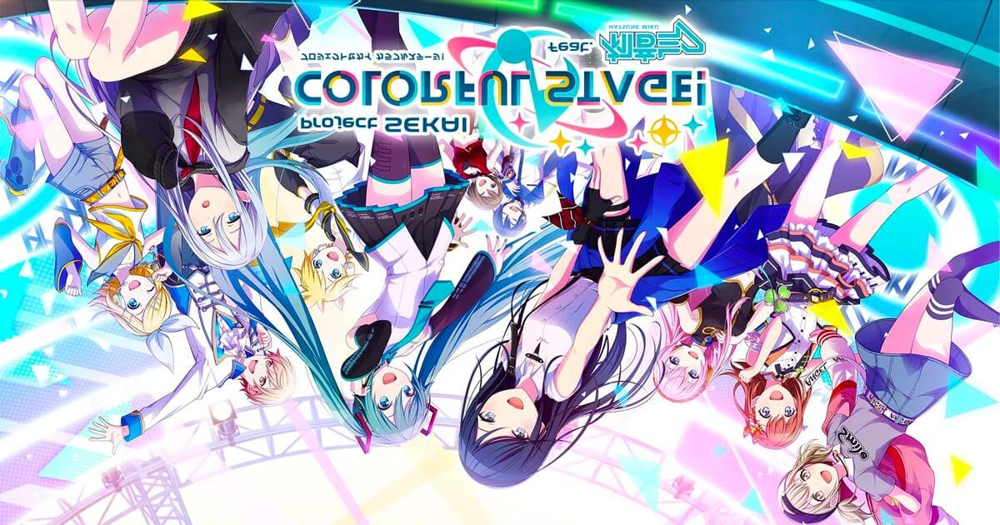

In [46]:
# Test Vertical flip method
display(augment_image(samp_img, vflip_transform, suffix = "flip-y"))

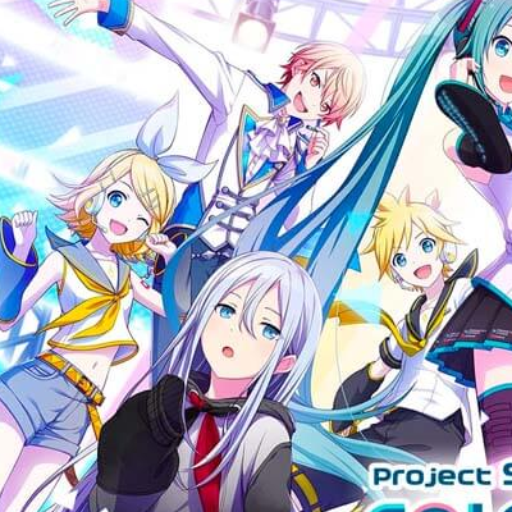

In [47]:
# Test Random crop method
display(augment_image(samp_img, crop_transform, suffix = "crop"))

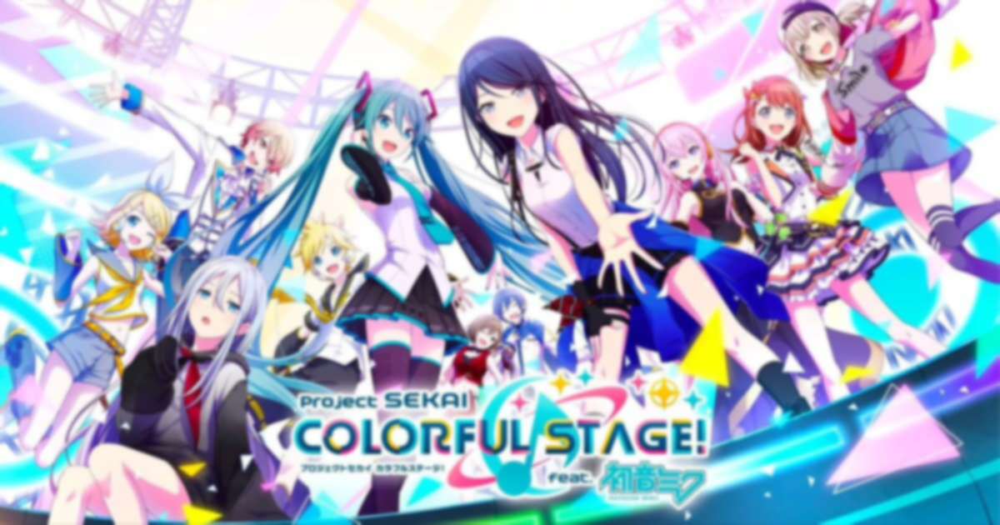

In [48]:
# Test Random blur method
display(augment_image(samp_img, blur_transform, suffix = "blur"))

Now that we have evaluated the performance of the output texts, in the following cells we will create an augmented image for each image in the baseline training data. The corresponding text file will remain the same, but we will make a copy of it so that it shares the same prefix as the augmented image.

In [49]:
# We can use this function to retrieve an image from our bucket in PIL Image format
def get_image(bucket, key):
    resp = s3.get_object(Bucket=bucket, Key=key)
    body = resp["Body"].read()
    img = Image.open(BytesIO(body))
    return img

In [53]:
# This function generates augmented data for our images in the baseline training data
def image_augmentation(src_bucket, dest_bucket, dest_prefix="image_augmented-training-data/"):

    # Define image transformers
    hflip_transform = transforms.RandomHorizontalFlip(p=1.0) # always flip image horizontally (left-right)
    vflip_transform = transforms.RandomVerticalFlip(p=1.0) # always flip image vertically (top-bottom)
    crop_transform = transforms.RandomCrop(400) # randomly crop a 400x400 patch from the original image
    blur_transform = transforms.GaussianBlur(kernel_size=11, sigma=(1.0, 3.0)) # random sigma in this range of sigma
    
    paginator = s3.get_paginator("list_objects_v2") # It returns objects in pages and not all at once.
    for page in paginator.paginate(Bucket=src_bucket, Prefix="baseline-training-data/"):

        for obj in page.get("Contents", []):
            key = obj["Key"]

            if obj['Size'] == 0 and key.endswith("/"): # skip the folder itself
                continue

            # Add new prefixes
            key_1 = dest_prefix + "hp" + "_" + key.split("/")[1]
            key_2 = dest_prefix + "vp" + "_" + key.split("/")[1]
            key_3 = dest_prefix + "rc" + "_" + key.split("/")[1]
            key_4 = dest_prefix + "rb" + "_" + key.split("/")[1]

            # New key for original text and image file
            new_key = dest_prefix + key.split("/")[1]

            if "text" in key:

                # Copy objects without top-level folder and rename them
                copy_source_text = {"Bucket": src_bucket, "Key": key}
                s3.copy_object(Bucket=dest_bucket, Key=new_key, CopySource=copy_source_text) # Original text
                s3.copy_object(Bucket=dest_bucket, Key=key_1, CopySource=copy_source_text) # Text for the first augemented image
                s3.copy_object(Bucket=dest_bucket, Key=key_2, CopySource=copy_source_text) # Text for the second augemented image
                s3.copy_object(Bucket=dest_bucket, Key=key_3, CopySource=copy_source_text) # Text for the third augemented image
                s3.copy_object(Bucket=dest_bucket, Key=key_4, CopySource=copy_source_text) # Text for the fourth augemented image
                
            elif "image" in key:

                # Get the image
                img = get_image(src_bucket, key)

                # Get image buffer
                def get_buffer(image):
                    buffer = io.BytesIO()
                    image.save(buffer, format="PNG")
                    buffer.seek(0)
                    return buffer

                # Get augmented images
                aug_img1 = get_buffer(augment_image(img, hflip_transform, suffix = "flip-x"))
                aug_img2 = get_buffer(augment_image(img, vflip_transform, suffix = "flip-y"))
                aug_img3 = get_buffer(augment_image(img, crop_transform, suffix = "crop"))
                aug_img4 = get_buffer(augment_image(img, blur_transform, suffix = "blur"))

                # Copy objects without top-level folder and rename them
                copy_source_image = {"Bucket": src_bucket, "Key": key}
                s3.copy_object(Bucket=dest_bucket, Key=new_key, CopySource=copy_source_image)
                s3.upload_fileobj(Fileobj=aug_img1, Bucket=dest_bucket, Key=key_1, ExtraArgs={"ContentType": "image/png"})
                s3.upload_fileobj(Fileobj=aug_img2, Bucket=dest_bucket, Key=key_2, ExtraArgs={"ContentType": "image/png"})
                s3.upload_fileobj(Fileobj=aug_img3, Bucket=dest_bucket, Key=key_3, ExtraArgs={"ContentType": "image/png"})
                s3.upload_fileobj(Fileobj=aug_img4, Bucket=dest_bucket, Key=key_4, ExtraArgs={"ContentType": "image/png"})

                print(f"✅ Augmented data for #{key.split('/')[1]} created successfully.")

    print(f"✅ All augmented image data have been successfully uploaded.")

In [54]:
# Create augmented image data
image_augmentation(src_bucket = "training-data-construction-zone", dest_bucket = "training-data-construction-zone")

✅ Augmented data for #image_000001.png created successfully.
✅ Augmented data for #image_000002.png created successfully.
✅ Augmented data for #image_000003.png created successfully.
✅ Augmented data for #image_000004.png created successfully.
✅ Augmented data for #image_000005.png created successfully.
✅ Augmented data for #image_000006.png created successfully.
✅ Augmented data for #image_000007.png created successfully.
✅ Augmented data for #image_000008.png created successfully.
✅ Augmented data for #image_000009.png created successfully.
✅ Augmented data for #image_000010.png created successfully.
✅ Augmented data for #image_000011.png created successfully.
✅ Augmented data for #image_000012.png created successfully.
✅ Augmented data for #image_000013.png created successfully.
✅ Augmented data for #image_000014.png created successfully.
✅ Augmented data for #image_000015.png created successfully.
✅ Augmented data for #image_000016.png created successfully.
✅ Augmented data for #im